In [1]:
import joblib
import numpy as np
import matplotlib.pyplot as plt
import os.path
import scipy as sp

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import ConfusionMatrixDisplay

In [2]:
# SEED fixée pour reproductibilité
SEED = 5

# Présentation du projet

Projet du cours d'Introduction au Machine Learning pour l'Image (IMLI)<br>
Promo : IMAGE 2024<br>
Enseignants : Guillaume Tochon & Joseph Chazalon

## Chargement et présentation des données

Les données qui sont mises à votre disposition pour ce projet sont celles du [_IEEE GRSS Data Fusion Contest 2013_](http://www.classic.grss-ieee.org/community/technical-committees/data-fusion/2013-ieee-grss-data-fusion-contest/). Le Data Fusion Contest de l'IEEE GRSS (Geoscience and Remote Sensing Society) est un challenge organisé chaque année par les membres du chapitre GRSS de l'association IEEE, qui est ouvert à tout chercheur, doctorant, étudiant, etc., et qui met en oeuvre des problématiques de fusion d'information (multi-capteurs, multi-dates, multi-sites, etc.) pour des applications en télédétection (imagerie satellitaire).

Les données du projet, présentées ci-dessous, ont été acquises au dessus de l'université de Houston en 2012, et se composent d'une image hyperpsectale de 144 bandes couvrant la portion $380-1050~$nm du spectre éléctromagnétique, et d'une image LiDAR. Les deux images sont à la même résolution spatiale de 2.5 m/pixel, et sont co-registrées (chaque pixel de l'une couvre exactement la même surface au sol que le pixel correspondant de l'autre image).

Les données sont stockées dans un format `.mat` (format Matlab). Le chargement se fait via `scipy.io.loadmat` qui retourne un dictionnaire.

In [3]:
data = sp.io.loadmat('data/2013_DFC_contest.mat')

### Image LIDAR ([plus d'infos ici](https://fr.wikipedia.org/wiki/Lidar))

Une image acquise par un capteur LiDAR fournit un modèle d'élévation de terrain (DSM, pour _digital surface model_). La scène est illuminée par un laser, et le capteur mesure le délai nécessaire à l'écho laser pour revenir depuis la cible. Connaissant la vitesse de déplacement du laser (vitesse de la lumière) et le temps nécessaire au laser pour faire l'aller/retour jusqu'à la scène, on peut en déduire facilement la distance. Lorsque le capteur LiDAR est embarqué sur un avion, la connaissance supplémentaire de l'altitude de vol de l'avion permet d'en déduire au final la hauteur du terrain (normalisée par rapport à une hauteur 0 fixée de manière arbitraire) : plus la valeur d'un pixel est élevée dans l'image LiDAR, plus la zone au sol correpondante est haute.

In [4]:
lidar = data['lidar']
print("L'image LiDAR est composée de %d lignes et %d colonnes "%(lidar.shape)+"au format %s"%lidar.dtype)

L'image LiDAR est composée de 349 lignes et 1905 colonnes au format float32


#### Visualisation du LiDAR

In [5]:
print("Valeur min = %1.3f et valeur max = %1.3f dans l'image LiDAR"%(lidar.min(),lidar.max()))

Valeur min = 4.420 et valeur max = 70.852 dans l'image LiDAR


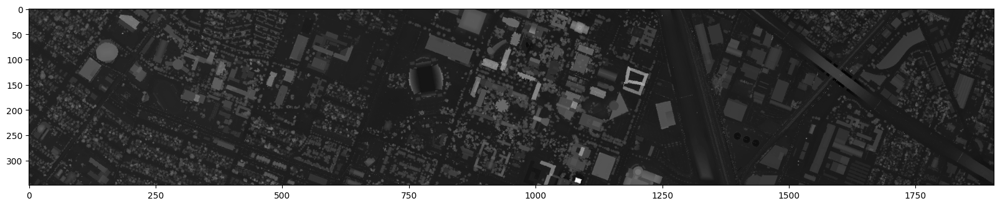

In [6]:
plt.figure(figsize=(20,5))
plt.imshow(lidar, cmap='gray')
plt.show()

### Image hyperspectrale ([plus d'infos ici](https://fr.wikipedia.org/wiki/Imagerie_hyperspectrale))

Les images hyperspectrales sont des "extensions" des images RGB traditionnelles dans le sens où elles n'ont plus 3 canaux, mais des centaines (voire des milliers). 
Un capteur hyperspectral échantillonne finement le spectre électromagnétique en collectant la quantité de lumière reçue dans de fines bandes de longueur d'onde (typiquement, une bande spectrale correspond a une largeur de quelques nanomètres). Au final, on obtient un cube de données avec $N$ canaux, et un pixel $\mathbf{x}$ n'est plus un triplet $\mathbf{x} = [x_R, x_G, x_B]$ comme pour une image RGB, mais un $N$-uplet $\mathbf{x} = [x_1,\dots,x_N] \in \mathbb{R}^N$ où chaque valeur $x_i$ correspond à la quantité de lumière qui a été reçue dans la $i$ème bande. Comme chaque bande est associée à une longueur d'onde particulière dans le spectre électromagnétique, tracer $\mathbf{x}$ en fonction de $i$ donne un _spectre de réflectance,_ en d'autres termes, comment la lumière qui atteint le capteur a interagi avec la matière dans la scène imagée. Comme deux matériaux différents (par exemple la végétation et le bitume) n'interagissent pas de la même manière avec la lumière, une image hyperspectrale permet d'identifier les composants macroscopiques (végétation, terre, métal, béton, eau, etc) présents dans la scène imagée. Les capteurs hyperspectraux sont largement utilisés dans le domaine de l'imagerie satellitaire (embarqués dans des avions et des satellites) à des fins d'observation de la Terre.

In [7]:
hsi_raw = data['hyper']
print("L'image hyperspectrale est composée de %d lignes, %d colonnes et %d bandes "%(hsi_raw.shape)
      +"au format %s"%hsi_raw.dtype)

L'image hyperspectrale est composée de 349 lignes, 1905 colonnes et 144 bandes au format uint16


#### Visualisation de l'image hyperspectrale

In [8]:
print("Valeur min = %d et valeur max = %d dans l'image hyperspectrale"%(hsi_raw.min(),hsi_raw.max()))

Valeur min = 0 et valeur max = 65517 dans l'image hyperspectrale


Une image hyperspectrale étant composée de centaines (voir milliers) de bandes, sa visualisation n'est pas directe : on ne peut pas demander à une routine de visualisation d'afficher telle quelle une image hyperspectrale. Il faut au préalable en extraire une version RGB, en sélectionnant 3 bandes spectrales (c'est-à-dire, 3 tranches du cube de données) dont les longueurs d'ondes correspondent à celles du rouge, du vert et du bleu.

Ici, l'intervalle de longueur d'ondes $380-1050$ nm est subdivisé en 144 bandes spectrales, et prenant comme longueurs d'ondes de référence 465 nm pour le bleu, 532 nm pour le vert et 630 nm pour le rouge, on peut calculer les bandes RGB suivantes : R = 54 $^e$ bande, G = 32 $^e$ bande et B = 18 $^e$ bande.

In [10]:
rgb_bands = [54,32,18]
hsi_rgb = hsi_raw[:,:,rgb_bands]
hsi_rgb = hsi_rgb/hsi_rgb.max() # normalisation des valeurs dans [0,1] pour l'affichage

In [11]:
# Don't mind me, I'm just here to pimp a little bit the RGB image
pmin,pmax = np.percentile(hsi_rgb,(1,95),axis=(0,1))
hsi_rgb_pimped = hsi_rgb.copy()
for i in range(pmin.size):
    hsi_rgb_pimped[:,:,i] = (hsi_rgb[:,:,i]-pmin[i])/(pmax[i]-pmin[i])
hsi_rgb_pimped[hsi_rgb_pimped<0] = 0
hsi_rgb_pimped[hsi_rgb_pimped>1] = 1

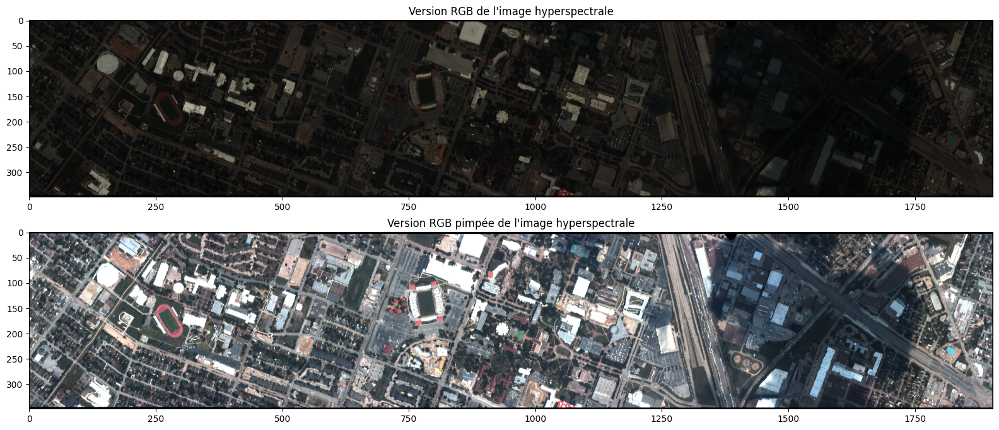

In [64]:
plt.figure(figsize=(20,8))
plt.subplot(211)
plt.title("Version RGB de l'image hyperspectrale")
plt.imshow(hsi_rgb)
plt.subplot(212)
plt.title("Version RGB pimpée de l'image hyperspectrale")
plt.imshow(hsi_rgb_pimped)
plt.show()

La scène est donc composée majoritairement de structures urbaines (maisons, bâtiments, routes, etc). On peut voir également des structures sportives (stade, piste de running, terrains de tennis). La partie droite de l'image est également assombrie par la présence d'un nuage (non discernable dans le LiDAR, qui est insensible aux artefacts d'illumations).

Pour facilier l'analyse visuelle de la scène, on peut la subdiviser en 3 sous-images correspondant à la partie gauche, à la partie centrale et à la partie droite de la scène. On peut remarquer en particulier une bande noire sur le pourtour de l'image hyperspectrale.

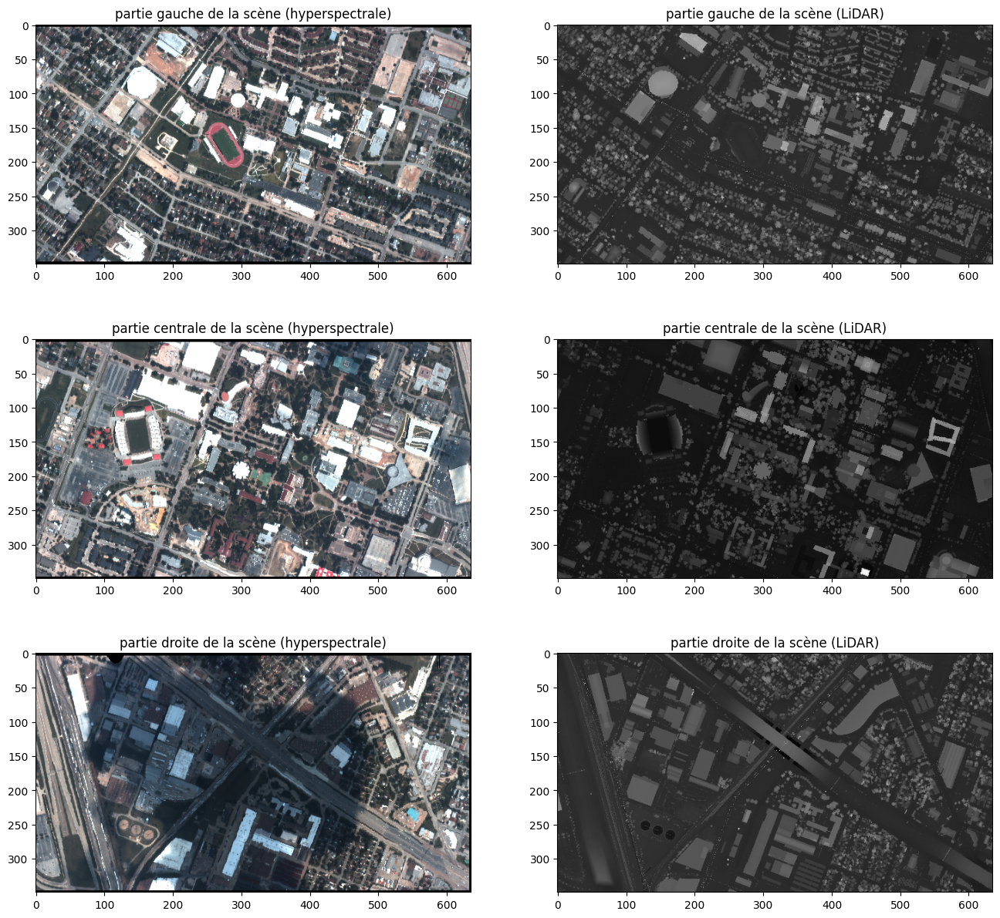

In [12]:
plt.figure(figsize=(16,15))
plt.subplot(321)
plt.title('partie gauche de la scène (hyperspectrale)')
plt.imshow(hsi_rgb_pimped[:,:635,:])
plt.subplot(322)
plt.title('partie gauche de la scène (LiDAR)')
plt.imshow(lidar[:,:635],cmap='gray')
plt.subplot(323)
plt.title('partie centrale de la scène (hyperspectrale)')
plt.imshow(hsi_rgb_pimped[:,635:1270,:])
plt.subplot(324)
plt.title('partie centrale de la scène (LiDAR)')
plt.imshow(lidar[:,635:1270],cmap='gray')
plt.subplot(325)
plt.title('partie droite de la scène (hyperspectrale)')
plt.imshow(hsi_rgb_pimped[:,1270:,:])
plt.subplot(326)
plt.title('partie droite de la scène (LiDAR)')
plt.imshow(lidar[:,1270:],cmap='gray')
plt.show()

## Chargement de la vérité terrain

Dans la scène présentée ci-dessus, 15 classes sémantiques ont été définies par les organisateurs du _Data Fusion Contest 2013_, et des zones au sol correspondant à ces différentes classes ont été identifées. Ces différentes zones de références constituent la vérité terrain, dont une partie vous est fournie dans le cadre du projet (la partie manquante, qui vous est cachée, servira de base de test pour la validation de votre solution).

In [22]:
groundtruth = np.load('groundtruth\groundtruth.npy')
groundtruth_info = np.load('groundtruth\groundtruth_info.npy', allow_pickle=True)
groundtruth_rgb = plt.imread('groundtruth\groundtruth.png')

La vérité terrain qui vous est fournie dans le cadre du projet est composée de trois fichiers : 
* `groundtruth_info` : un récapitulatif des différentes classes sémantiques (numérotées de 1 à 15) 

In [23]:
groundtruth_info

array([{'class_name': 'grass_healthy', 'class_label': 1, 'class_color': array([  0, 205,   0], dtype=int64)},
       {'class_name': 'grass_stressed', 'class_label': 2, 'class_color': array([127, 255,   0], dtype=int64)},
       {'class_name': 'grass_synthetic', 'class_label': 3, 'class_color': array([ 46, 205,  87], dtype=int64)},
       {'class_name': 'tree', 'class_label': 4, 'class_color': array([  0, 139,   0], dtype=int64)},
       {'class_name': 'soil', 'class_label': 5, 'class_color': array([160,  82,  45], dtype=int64)},
       {'class_name': 'water', 'class_label': 6, 'class_color': array([  0, 255, 255], dtype=int64)},
       {'class_name': 'residential', 'class_label': 7, 'class_color': array([255, 255, 255], dtype=int64)},
       {'class_name': 'commercial', 'class_label': 8, 'class_color': array([216, 191, 216], dtype=int64)},
       {'class_name': 'road', 'class_label': 9, 'class_color': array([255,   0,   0], dtype=int64)},
       {'class_name': 'highway', 'class_label':

Chaque classe est composée d'environ $190$ pixels (ce qui est peu...)

In [24]:
for ii in range(15):
    print("Classe %d : %s (%d pixels au total)"%(ii+1,groundtruth_info[ii]['class_name'],(groundtruth==ii+1).sum()))

Classe 1 : grass_healthy (198 pixels au total)
Classe 2 : grass_stressed (190 pixels au total)
Classe 3 : grass_synthetic (192 pixels au total)
Classe 4 : tree (188 pixels au total)
Classe 5 : soil (186 pixels au total)
Classe 6 : water (182 pixels au total)
Classe 7 : residential (196 pixels au total)
Classe 8 : commercial (191 pixels au total)
Classe 9 : road (193 pixels au total)
Classe 10 : highway (191 pixels au total)
Classe 11 : railway (181 pixels au total)
Classe 12 : parking_lot1 (192 pixels au total)
Classe 13 : parking_lot2 (184 pixels au total)
Classe 14 : tennis_court (181 pixels au total)
Classe 15 : running_track (187 pixels au total)


* `groundtruth` : la position spatiale dans la scène des différents pixels appartenant à ces 15 classes thématiques. Chaque pixel appartenant à la i$^e$ classe est donc de valeur $i$ dans cette carte de vérité terrain (par convention, tous les pixels dont la classe est inconnue sont de valeur $0$).

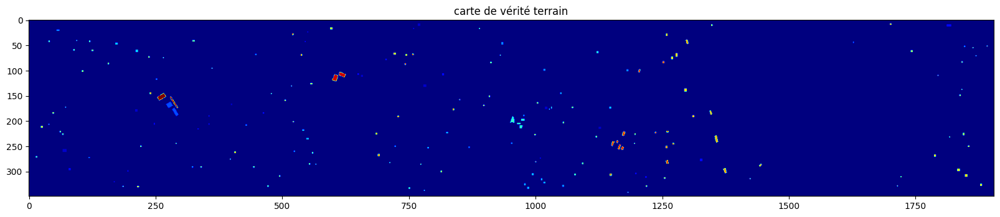

In [25]:
plt.figure(figsize=(20,5))
plt.title('carte de vérité terrain')
plt.imshow(groundtruth, cmap='jet')
plt.show()

In [26]:
groundtruth

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=int64)

* `groundtruth.png` : pour faciliter la visualisation des différentes classes composant la vérité terrain, on peut également attribuer à chaque classe une couleur (arbitraire), et représenter la vérité terrain comme une image RGB.

In [27]:
cls_rgb = []
for ii in groundtruth_info:
    cls_rgb.append(ii['class_color'])
cls_rgb = np.array(cls_rgb).reshape(15,-1,3)

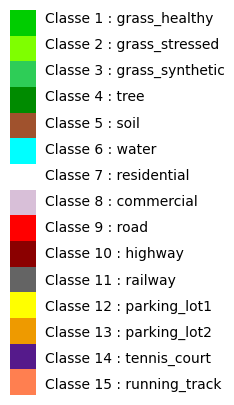

In [28]:
plt.figure(figsize=(5,5))
plt.imshow(cls_rgb)
plt.axis('off')
for cls in range(15):
        plt.text(0.85,1.02*cls,'Classe %d : %s'%(cls+1,groundtruth_info[cls]['class_name']))
plt.show()

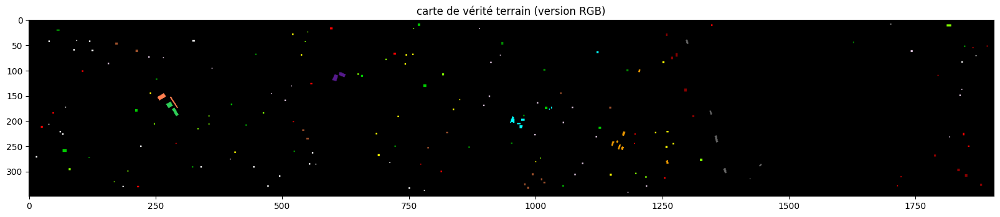

In [29]:
plt.figure(figsize=(20,5))
plt.title('carte de vérité terrain (version RGB)')
plt.imshow(groundtruth_rgb)
plt.show()

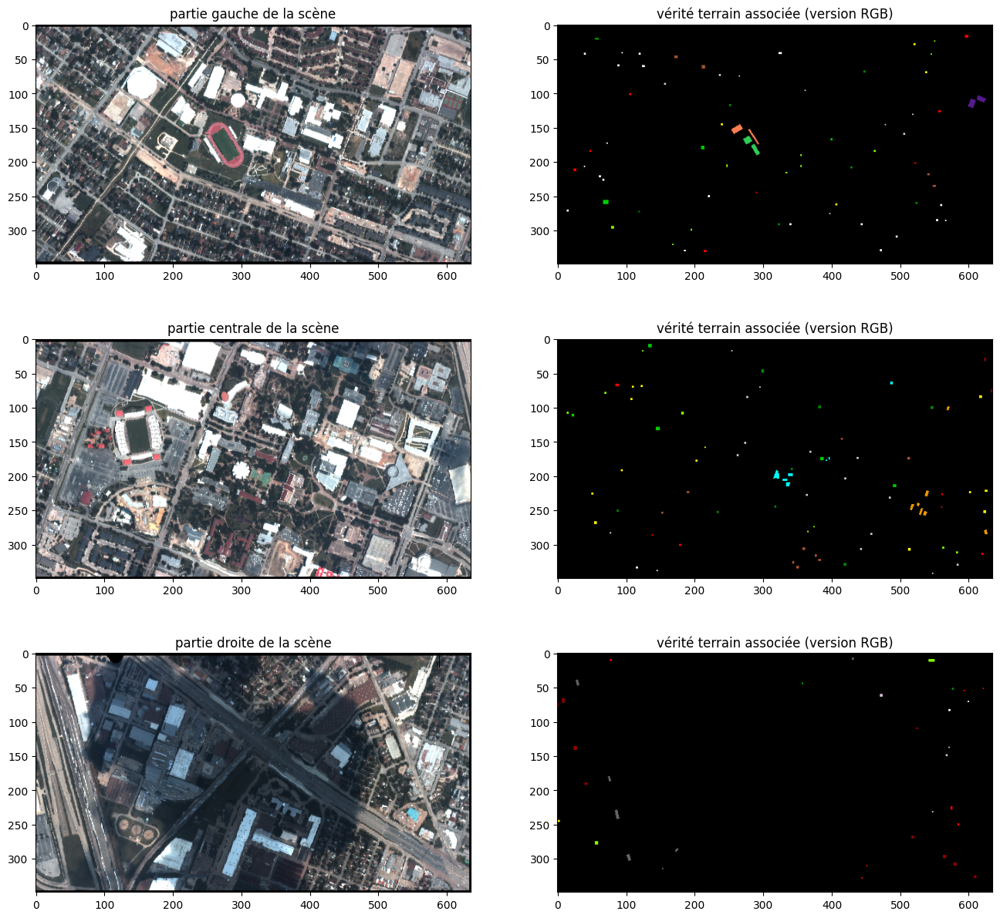

In [30]:
plt.figure(figsize=(16,15))
plt.subplot(321)
plt.title('partie gauche de la scène')
plt.imshow(hsi_rgb_pimped[:,:635,:])
plt.subplot(322)
plt.title('vérité terrain associée (version RGB)')
plt.imshow(groundtruth_rgb[:,:635,:],cmap='gray')
plt.subplot(323)
plt.title('partie centrale de la scène')
plt.imshow(hsi_rgb_pimped[:,635:1270,:])
plt.subplot(324)
plt.title('vérité terrain associée (version RGB)')
plt.imshow(groundtruth_rgb[:,635:1270,:],cmap='gray')
plt.subplot(325)
plt.title('partie droite de la scène')
plt.imshow(hsi_rgb_pimped[:,1270:,:])
plt.subplot(326)
plt.title('vérité terrain associée (version RGB)')
plt.imshow(groundtruth_rgb[:,1270:,:],cmap='gray')
plt.show()

## Objectif du projet

L'objectif du projet est d'effectuer **la classification sémantique des pixels de la scène**, c'est-à-dire assigner à chaque pixel l'identifiant (entre 1 et 15) de la classe à laquelle il appartient. Par exemple, tous les pixels de maison doivent être assignés à la classe $7$ (`residential`), tous les pixels de route doivent être assignés à la classe $9$ (`road`), etc.

Les images hyperspectrales (réflectance) et LiDAR (hauteur) portent une information complémentaire car de nature physique différente. Deux zones adjacentes dans la scène peuvent avoir des réponses spectrales très proches (par exemple, de la végétation et de l'herbe), mais des hauteurs différentes dans le LiDAR. À l'inverse, deux zones adjacentes peuvent avoir des hauteurs identiques dans l'image LiDAR (par exemple, de l'herbe et de la route) mais des réponses spectrales très différentes.

<u> pro tip </u> : une image hyperspectrale est nativement représentée comme un cube de données de dimensions $r \times c \times N$ où $r$ et $c$ correspondent au nombre de lignes et de colonnes dans l'image, et $N$ est le nombre de canaux, ce qui ne correspond pas au format attendu par la plupart des algorithmes de `scikit-image` ($N_{samples} \times N_{features}$, où $N_{samples}$ est le nombre d'échantillons et $N_{features}$ est le nombre de caractéristiques (la dimensionalité) de chaque échantillon). 
<br> Pour transformer une image hyperspectrale au format standard de `scikit-image`, on pourra simplement utiliser `hsi.reshape(rc,N)`

# Introduction


Pour ce projet, ne sachant pas exactement à quelle qualité de résultat s'attendre, nous avons commencé par faire en sorte de mieux visualiser le problème.

Pour cela nous affichons la répartition de notre jeu de données de départ sur la carte à prédire. On se rend compte qu'il est de petite taille.

Nous engageons ensuite une approche basique pour avoir un résultat avant de raffiner celui ci en traitant la donnée d'entrée et en utilisant le Lidar

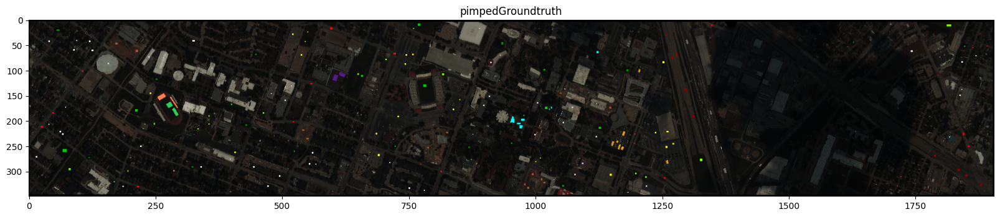

In [32]:
pimpedGroundtruth = [[[groundtruth_rgb[i][j][k] if not np.all(groundtruth_rgb[i][j] == 0) else hsi_rgb[i][j][k] for k in range(groundtruth_rgb.shape[2])] for j in range(groundtruth_rgb.shape[1])] for i in range(groundtruth_rgb.shape[0])]
plt.figure(figsize=(20,5))
plt.title('pimpedGroundtruth')
plt.imshow(pimpedGroundtruth)


# Approche basique

Nous choisissons d'utiliser un classifieur de type Random Forest pour commencer

Pour cela, nous devons reformater nos données pour qu'elles correspondent au format d'entrée du modèle RandomForestClassifier fournis par sklearn

Seuls les pixels ayant une valeur dans notre matrice de vérité terrain nous intéressent. Ce seront donc les seuls à être pris en compte lors de l'apprentissage

In [33]:
# Reformatage de la matrice d'images spectrales et de la verité terrain
r, c, N = hsi_raw.shape
hsi = hsi_raw.reshape(r*c, N)
groundtruth_reshaped = groundtruth.reshape(r*c)

# On ne garde que les valeurs pour lesquelles on a une verité terrain
hsi_train = hsi[groundtruth_reshaped != 0]
groundtruth_train = groundtruth_reshaped[groundtruth_reshaped != 0]

print(hsi_train.shape, groundtruth_reshaped.shape)

(2832, 144) (664845,)


Nous choisissons d'utiliser un classifier de type Random Forest pour commencer

In [54]:
# True si l'on veut charger le modèle depuis le fichier de sauvegarde, False pour en entrainer un nouveau
load = False

In [35]:
# Creation du classifier
filename = 'random_forest1.joblib'

if (not load):
    classifier = RandomForestClassifier(random_state=SEED, n_estimators=100, min_samples_leaf=1)
    
    # Entrainement du modèle sur les données d'imagerie spectrales
    classifier.fit(hsi_train, groundtruth_train)

    joblib.dump(classifier, filename)
    
else:
    classifier = joblib.load(filename)
    

In [36]:
# Prédiction des résultats sur toute l'image
predicted_labels = classifier.predict(hsi)

# Reformatage des données
predicted_gd = predicted_labels.reshape(r, c)

Nous avons maintenant une prédiction de la classe de tous nos pixels. 

# Observations

Pour mieux visualiser le résultat, voici une image sur laquelle la couleur de chaque pixel est celle de la classe attribuée par le classifier lors de la prédiction

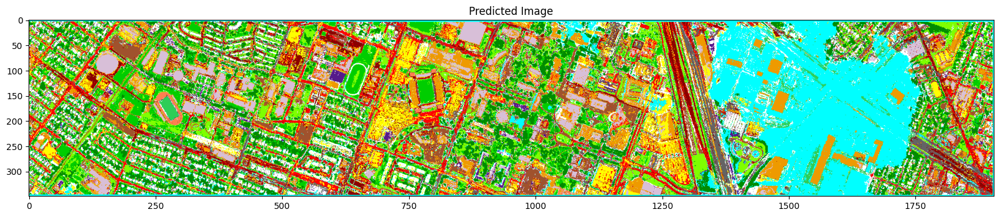

In [80]:
# Coloration des pixels selon la couleur de la classe qui leur a été attribuée pendant la prédiction
pred_img = cls_rgb[predicted_gd - 1]

# Reformatage des données pour l'affichage
pred_img = np.squeeze(pred_img, axis=2)

# Affichage
plt.figure(figsize=(20,5))
plt.title('Predicted Image')
plt.imshow(pred_img)

# Observations

On se rend compte ici, que beaucoup les prédictions sont assez bonnes quand on les compare avec les couleurs de chaque classe.

Seule la partie couverte par le nuage n'a pas rendu de résultats satisfaisants. Cela est dû au fait qu'aucune vérité terrain n'est fournie pour cette zone et que les pixels étants beaucoup plus sombres, il est difficile de deviner la classe.

Nous allons donc devoir avoir recours au Lidar et à du traitement d'image pour réaliser une classification correcte

# Pré-traitement d'image: 
## L'ombre du nuage

### Création du masque

Pour éliminer le nuage, nous avons dans un premier temps besoin de détecter quels pixels sont présents dans celui-ci. 

Pour cela, nous créons un masque dépendant de la luminosité de chaque pixel.

Nous travaillons sur la bande 50 de l'image spectrale, car après plusieurs tests, elle se révèle être celle contenant la plus grande quantité de lumière dans le nuage.

In [37]:
def diplayMask(threshold):
    mask = (hsi_raw[:,:,50] < threshold)
    plt.figure(figsize=(20,5))
    plt.title("Masque du nuage")
    plt.imshow(mask)
    plt.show()

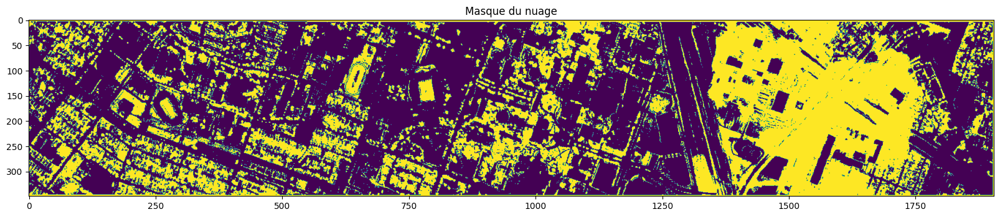

In [38]:
diplayMask(4000)

On remarque qu'avec un seuil de 4000, trop de pixels sont pris en compte : le seuil est trop haut.

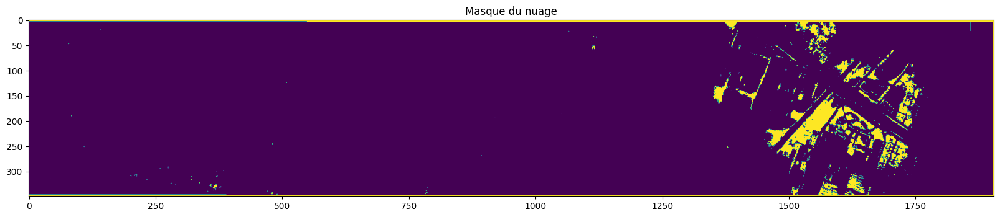

In [40]:
diplayMask(1500)

On remarque qu'avec un seuil de 1500, pas assez ne le sont: le seuil est trop bas.

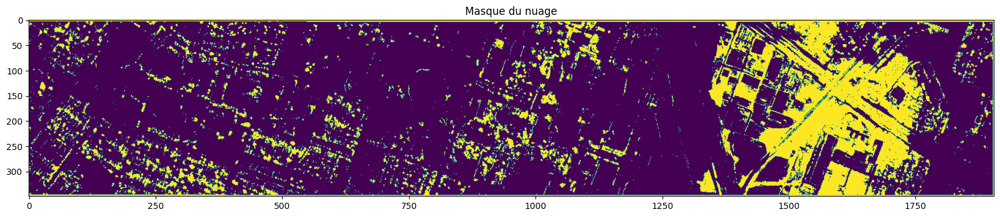

In [41]:
diplayMask(2800)

Après plusieurs tests, nous avons choisis d'utiliser le seuil 2800.

In [42]:
mask = (hsi_raw[:,:,50] < 2800)

### Application du masque

Notre masque nous indique les pixels présents dans le nuage. Nous avons donc juste besoin de multiplier la valeur de ces pixels pour augementer la luminosité de ceux-ci.

Après plusieurs essais, nous avons trouvé que la meilleur valeur pour ce facteur de multiplication était 7

In [43]:
brightenedImage = hsi_raw[:,:,50].copy()
brightenedImage[mask == True] = brightenedImage[mask == True] * 7

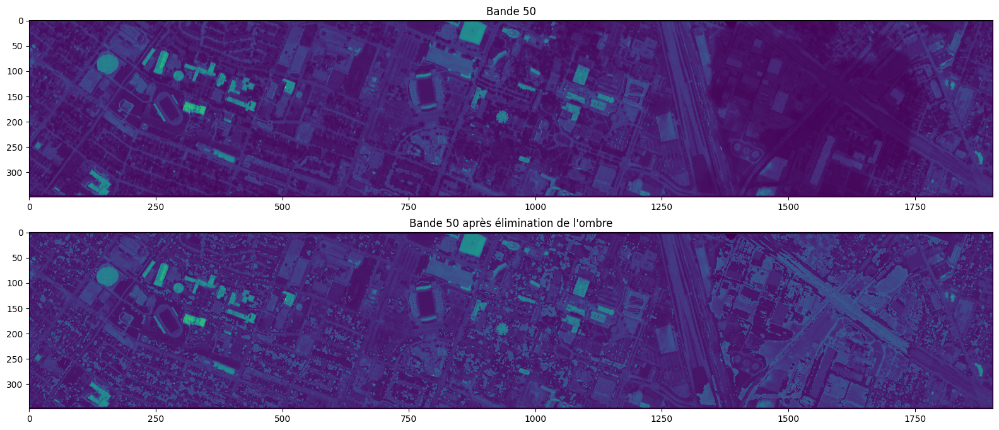

In [44]:
plt.figure(figsize=(20,8))
plt.subplot(211)
plt.title("Bande 50")
plt.imshow(hsi_raw[:,:,50])
plt.subplot(212)
plt.title("Bande 50 après élimination de l'ombre")
plt.imshow(brightenedImage)
plt.show()

In [45]:
hsi_brightened = hsi_raw.copy()
for spectralIndex in range(hsi_brightened.shape[2]):
    hsi_brightened[:,:,spectralIndex][mask == True] = hsi_brightened[:,:,spectralIndex][mask == True] * 7

## Prise en compte du Lidar

Pour prendre en compte le Lidar, nous avons décidé de l'ajouter aux données d'entrainement pour le modèle.

Par ailleurs, les valeurs contenues dans celui-ci sont bien supérieures à celles contenues dans les images hyperspectrales. Nous avons donc besoin de les normaliser avant l'ajout.

Nous avons pour cela plusieurs méthodes à notre disposition :

### Normalisation simple

In [46]:
simpleNormLidar = lidar.copy()
simpleNormLidar = simpleNormLidar / np.linalg.norm(simpleNormLidar, axis=1)[:, np.newaxis] * 65517

### Normalisation TanH

In [47]:
tanhNormLidar = lidar.copy()
mean = np.mean(tanhNormLidar)
var = np.std(tanhNormLidar)
tanhNormLidar = (np.tanh(0.01 * (tanhNormLidar - mean) / var) + 1) / 2

### Normalisation Z-Score

In [48]:
zScoreLidar = lidar.copy()
mean = np.mean(zScoreLidar)
var = np.std(zScoreLidar)
zScoreLidar = (zScoreLidar - mean) / var

### Observations

Après avoir testé l'efficacité de ces différentes méthodes de normalisation, la normalisation Z-score s'est révélée être la plus efficace. 

Nous ajoutons donc maintenant le Lidar normalisé à notre jeu d'images spectrales pour former le dataset d'entrainement. 

Nous avons besoin que le Lidar soit pris en compte de façon plus importante qu'une bande d'image hyperspectrale, nous l'ajoutons donc plusieurs fois. Après plusieurs essais, 50 fois s'est révélé être la proportion adéquate.

In [49]:
# Reformatage de la matrice d'images spectrales et de la verité terrain
r, c, N = hsi_raw.shape
hsi_brightened = hsi_brightened.reshape(r*c, N)

# On ne garde que les valeurs pour lesquelles on a une verité terrain
hsi_train = hsi_brightened[groundtruth_reshaped != 0]

# Reformatage du lidar
lidar_reshaped = zScoreLidar.reshape(r*c)

# Création d'une matrice contenant 50 fois le lidar
lidars_train = np.tile(lidar_reshaped[groundtruth_reshaped != 0], (50,1)).T

# Création de la matrice contenant les images spectrales et les 50 lidars
data_train = np.concatenate((hsi_train, lidars_train), axis=1)

X_train, X_test, Y_train, Y_test = train_test_split(data_train, groundtruth_train, test_size=0.10, random_state=SEED)

X_train.shape

(2548, 194)

Une fois ce nouveau jeu d'entrainement créé, on réalise à nouveau un entraînement ou l'on charge le modèle depuis un fichier de sauvegarde.

In [52]:
# Set to False to retrain the model and to True to load it from a save file
load = False

In [53]:
filename = "k_neighbors.joblib"
if (not load):
    classifier2 = KNeighborsClassifier(n_neighbors=3)
    classifier2.fit(X_train, Y_train)

    joblib.dump(classifier2, filename)
    
else:
    classifier2 = joblib.load(filename)

In [55]:
classifier2.score(X_test, Y_test)

0.8661971830985915

In [56]:
# Creation du classifier
filename = 'random_forest2.joblib'
if (not load):
    classifier2 = RandomForestClassifier(random_state=SEED, n_estimators=100, min_samples_leaf=1)
    classifier2.fit(X_train, Y_train)

    joblib.dump(classifier2, filename)
    
else:
    classifier2 = joblib.load(filename)

In [57]:
classifier2.score(X_test, Y_test)

0.926056338028169

Grace aux scores calculés, on se rend compte que les meilleur des classifiers est le random forest

On prédit ensuite les résultats sur l'image totale

In [58]:
images = np.concatenate((hsi_brightened, np.tile(lidar_reshaped, (50,1)).T), axis=1)

# Prédiction des résultats avec toutes les images spectrales et lidars
predicted_labels2 = classifier2.predict(images)

# Reformatage des données
predicted_gd2 = predicted_labels2.reshape(r, c)

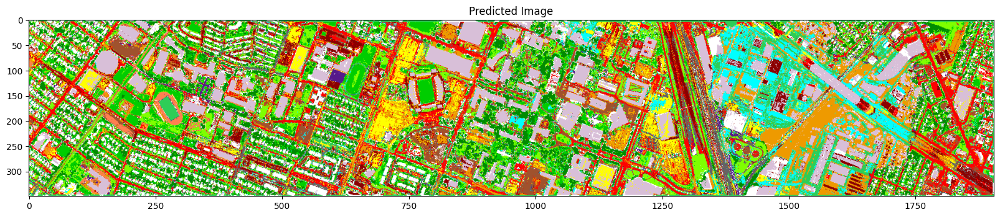

In [59]:
# Coloration des pixels selon la couleur de la classe qui leur a été attribuée pendant la prédiction
pred_img2 = cls_rgb[predicted_gd2 - 1]

# Reformatage des données pour l'affichage
pred_img2 = np.squeeze(pred_img2, axis=2)

# Affichage
plt.figure(figsize=(20,5))
plt.title('Predicted Image')
plt.imshow(pred_img2)

### Observations

Cette fois ci, les pixels contenus dans le nuage sont beaucoup mieux classés, mais l'image est beaucoup plus bruité. Le résultat reste beaucoup plus acceptable que le précédent. 

Nous avons ensuite affiché la matrice de confusion pour identifier les classes qui posaient le plus de problèmes.

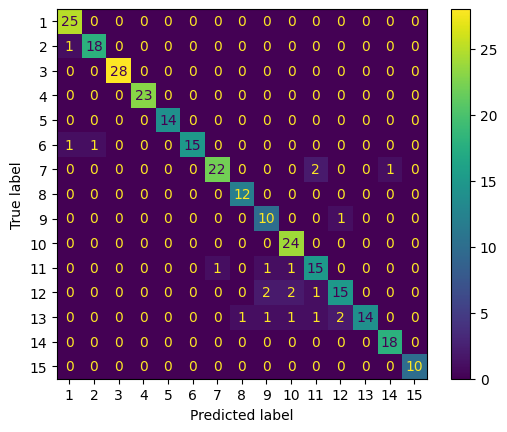

In [60]:
ConfusionMatrixDisplay.from_estimator(classifier2, X_test, Y_test)

Très peu d'erreurs sont finalement détectées, ce qui est également lié au jeu de données très réduit que nous utilisons ici.

Les classes les plus problématiques sont la 12 et la 13, qui représentent respectivement les classe de parking 1 et 2. Même dans ces cas, le taux d'erreur est assez bas.

# Pistes d'amélioration

Nous avons créé un modèle qui peut répondre à des attentes assez basiques de classification, mais des pistes d'amélioration sont encore à creuser pour possiblement améliorer notre résultat. 

Parmis celles-ci:
- Utiliser une autre technique pour éliminer le nuage (une qui ajouterai moins de bruit à l'image globale)
- Utiliser d'autre classifiers et optimiser leurs paramètres pour mieux correspondre à notre problème


In [61]:
def classifyPixels(hsi, lidar, model):
    # Pré-traitement
    
    # Le nuage
    hsi_brightened = hsi.copy()
    mask = (hsi_brightened[:,:,50] < 2800)
    for i in range(hsi_brightened.shape[2]):
        hsi_brightened[:,:,i][mask == True] = hsi_brightened[:,:,i][mask == True] * 7
        
    # Normalisation du LIDAR
    normalized_lidar = lidar.copy()
    mean = np.mean(normalized_lidar)
    var = np.std(normalized_lidar)
    normalized_lidar = (normalized_lidar - mean) / var
    
    # Reformatage des données
    r, c, N = hsi_raw.shape
    hsi_brightened = hsi_brightened.reshape(r*c, N)
    
    # Création du jeu de données de prédiction
    images = np.concatenate((hsi_brightened, np.tile(lidar_reshaped, (50,1)).T), axis=1)
    
    # Prediction
    groundtruth = np.load('/groundtruth/groundtruth.npy')
    predictions = model.predict(images)
    predictions = predictions.reshape(groundtruth.shape)
    
    # Export
    # Sanity check 1: do predictions have the correct shape?
    assert(predictions.shape == groundtruth.shape)
    
    # Sanity check 2: are predicted values in the correct domain?
    assert(np.all(np.in1d(predictions.flatten(), np.unique(groundtruth))))
    
    filename_predictions = "predictions.npz"
    np.savez_compressed(filename_predictions, data=predictions)
    assert(os.path.exists('/predictions.npz'))
    
    # Sanity check 3: read file again and check its content is consistent
    loaded_data = np.load('/predictions.npz')['data']
    assert(np.allclose(loaded_data, predictions))
    
    print(f"Export terminé !")